# HW 2

## MLE

### T1
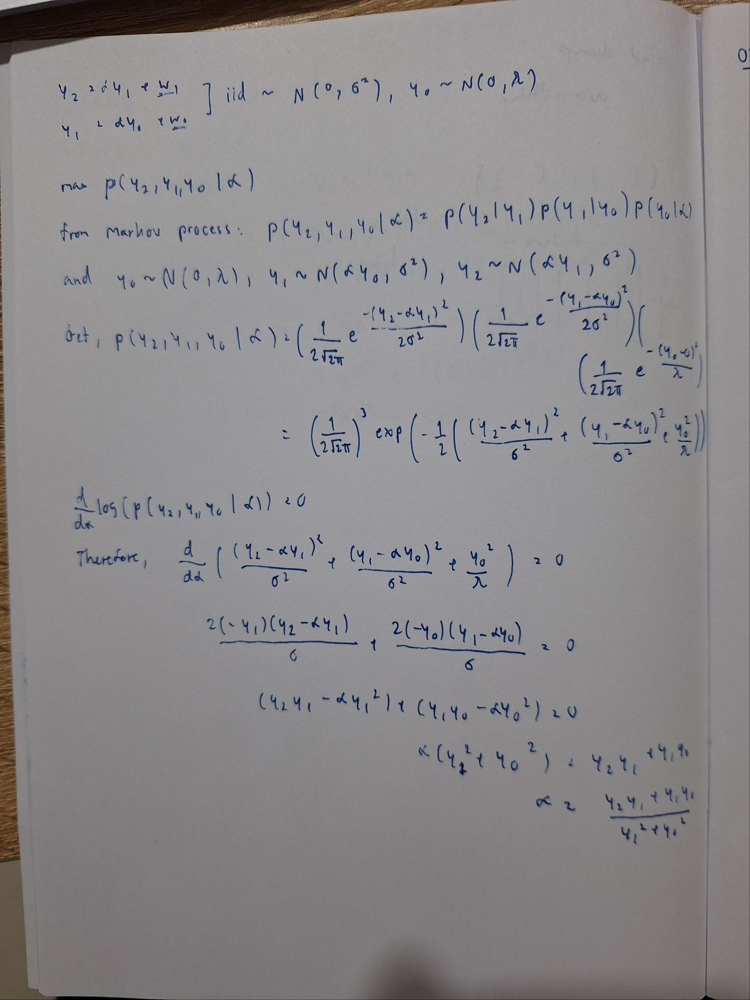{width=50%}

### OT1
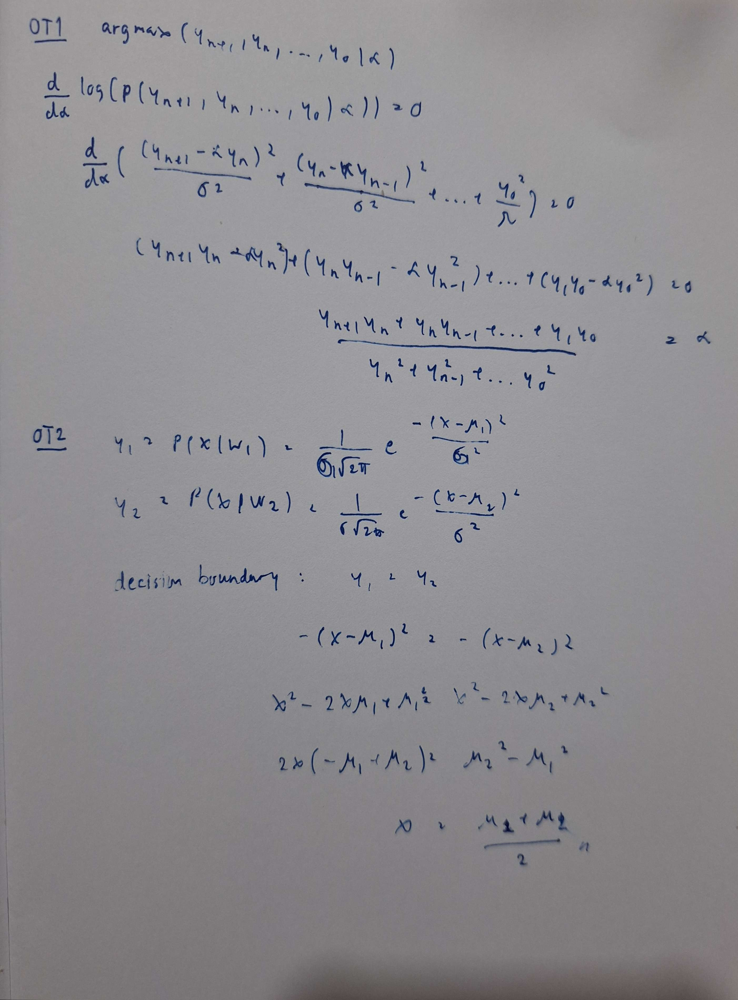{width=50%}

## Simple Bayes Classifier

### T2

In [4]:
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

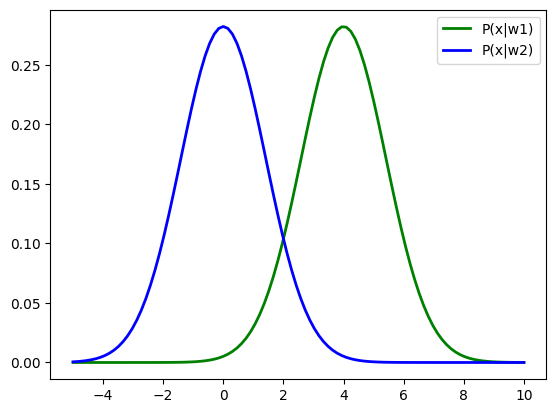

In [5]:
rv1 = norm(4, np.sqrt(2))
rv2 = norm(0, np.sqrt(2))

x = np.linspace(-5, 10, 100)

plt.plot(x, rv1.pdf(x), "g-", lw=2, label="P(x|w1)")
plt.plot(x, rv2.pdf(x), "b-", lw=2, label="P(x|w2)")
plt.legend()
plt.show()

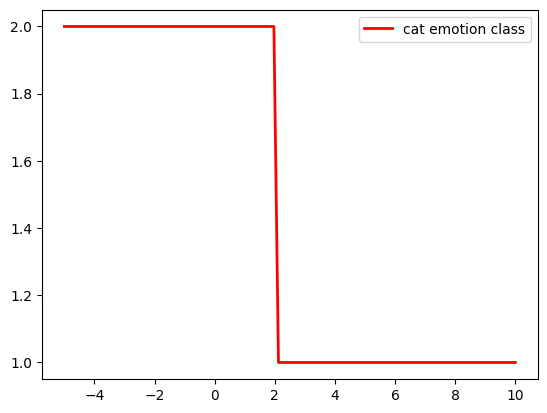

In [6]:
prior_ratio = 0.5/0.5 # equal prior; P(w2)/P(w1)

# visualize the likelihood ratio
plt.plot(
    x,
    np.where(rv1.pdf(x) / rv2.pdf(x) > prior_ratio, 1, 2),
    "r-",
    lw=2,
    label="cat emotion class",
)
plt.legend()
plt.show()

Decision boundary is a point where the probability of the two classes are equal, at x = 2.

### T3

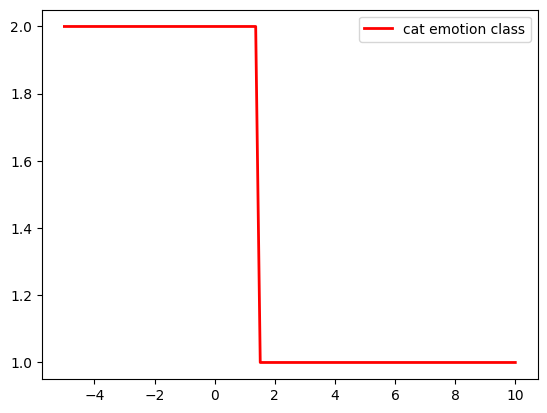

In [7]:
prior_ratio = 0.25/0.75  # equal prior; P(w2)/P(w1)

# visualize the likelihood ratio
plt.plot(
    x,
    np.where(rv1.pdf(x) / rv2.pdf(x) > prior_ratio, 1, 2),
    "r-",
    lw=2,
    label="cat emotion class",
)
plt.legend()
plt.show()

Decision boundary is moved a little to the left, expanding the region of class 1.

### OT3

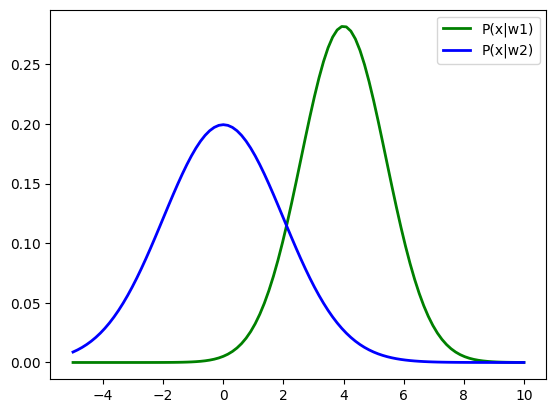

In [8]:
rv1 = norm(4, np.sqrt(2))
rv2 = norm(0, np.sqrt(4))

x = np.linspace(-5, 10, 100)

plt.plot(x, rv1.pdf(x), "g-", lw=2, label="P(x|w1)")
plt.plot(x, rv2.pdf(x), "b-", lw=2, label="P(x|w2)")
plt.legend()
plt.show()

## Employee Attrition Prediction



In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### read CSV

In [10]:
df = pd.read_csv('hr-employee-attrition-with-null.csv')

### Dataset statistic

In [11]:
df.describe()

,Unnamed: 0,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1176.000000,1176.000000,1176.00000,1176.000000,1176.0,1176.000000,1176.000000,1176.000000,1176.000000,...,1176.000000,1176.0,1176.000000,1176.000000,1176.000000,1176.000000,1176.000000,1176.000000,1176.000000,1176.000000
mean,734.500000,37.134354,798.875850,9.37500,2.920918,1.0,1031.399660,2.733844,65.821429,2.728741,...,2.694728,80.0,0.752551,11.295068,2.787415,2.770408,7.067177,4.290816,2.159014,4.096939
std,424.496761,9.190317,406.957684,8.23049,1.028796,0.0,601.188955,1.092992,20.317323,0.705280,...,1.093660,0.0,0.822550,7.783376,1.290507,0.705004,6.127836,3.630901,3.163524,3.537393
min,0.000000,18.000000,102.000000,1.00000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,...,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,367.250000,30.000000,457.750000,2.00000,2.000000,1.0,494.750000,2.000000,48.000000,2.000000,...,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,734.500000,36.000000,798.500000,7.00000,3.000000,1.0,1027.500000,3.000000,66.000000,3.000000,...,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,1101.750000,43.000000,1168.250000,15.00000,4.000000,1.0,1562.250000,4.000000,84.000000,3.000000,...,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,2.250000,7.000000
max,1469.000000,60.000000,1499.000000,29.00000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,...,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,37.000000,18.000000,15.000000,17.000000


In [12]:
df.head()

,Unnamed: 0,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0,41.0,Yes,Travel_Rarely,NaN,NaN,1.0,NaN,Life Sciences,1.0,...,1.0,80.0,0.0,8.0,0.0,NaN,6.0,NaN,0.0,NaN
1,1,NaN,No,NaN,279.0,Research & Development,NaN,NaN,Life Sciences,1.0,...,4.0,NaN,1.0,10.0,NaN,3.0,10.0,NaN,NaN,7.0
2,2,37.0,Yes,NaN,1373.0,NaN,2.0,2.0,NaN,1.0,...,NaN,80.0,0.0,7.0,3.0,NaN,NaN,0.0,NaN,0.0
3,3,NaN,No,Travel_Frequently,1392.0,Research & Development,3.0,4.0,Life Sciences,NaN,...,3.0,NaN,NaN,8.0,3.0,NaN,8.0,NaN,3.0,0.0
4,4,27.0,No,Travel_Rarely,591.0,Research & Development,2.0,1.0,Medical,1.0,...,4.0,80.0,1.0,6.0,NaN,3.0,2.0,2.0,2.0,NaN


### Feature transformation

In [13]:
df.loc[df["Attrition"] == "no", "Attrition"] = 0.0
df.loc[df["Attrition"] == "yes", "Attrition"] = 1.0
string_categorical_col = ['Department', 'Attrition', 'BusinessTravel', 'EducationField', 'Gender', 'JobRole',
                              'MaritalStatus', 'Over18', 'OverTime']

# ENCODE STRING COLUMNS TO CATEGORICAL COLUMNS
for col in string_categorical_col:
    # INSERT CODE HERE
    df[col] = df[col].astype('category').cat.codes

# HANDLE NULL NUMBERS
# INSERT CODE HERE


df = df.loc[:, ~df.columns.isin(['EmployeeNumber', 'Unnamed: 0', 'EmployeeCount', 'StandardHours', 'Over18'])]

In [14]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41.0,1,2,NaN,-1,1.0,NaN,1,2.0,0,...,NaN,1.0,0.0,8.0,0.0,NaN,6.0,NaN,0.0,NaN
1,NaN,0,-1,279.0,1,NaN,NaN,1,3.0,1,...,NaN,4.0,1.0,10.0,NaN,3.0,10.0,NaN,NaN,7.0
2,37.0,1,-1,1373.0,-1,2.0,2.0,-1,NaN,1,...,3.0,NaN,0.0,7.0,3.0,NaN,NaN,0.0,NaN,0.0
3,NaN,0,1,1392.0,1,3.0,4.0,1,NaN,0,...,3.0,3.0,NaN,8.0,3.0,NaN,8.0,NaN,3.0,0.0
4,27.0,0,2,591.0,1,2.0,1.0,3,1.0,1,...,3.0,4.0,1.0,6.0,NaN,3.0,2.0,2.0,2.0,NaN


###  Spliting data into train and test

In [15]:
from sklearn.model_selection import train_test_split

In [16]:
df_train, df_test = train_test_split(df, test_size=0.1, random_state=42, stratify=df['Attrition'])

### Display histogram of each feature

In [17]:
def display_histogram(df, col_name, cls, n_bin = 40):
    # INSERT CODE HERE

    # remove NaN values
    col_no_nan = df[~np.isnan(df[col_name])][col_name]
    
    # bin the data into `n_bin` equally spaced bins
    # hist is the count for each bin
    # bin_edge is the edge values of the bins
    hist, bin_edge = np.histogram(col_no_nan, n_bin)
    
    print("zero counts bins: ", np.sum(hist == 0))
    
    # plot the histogram
    plt.fill_between(bin_edge.repeat(2)[1:-1], hist.repeat(2), facecolor='steelblue')
    plt.show()

zero counts bins:  0


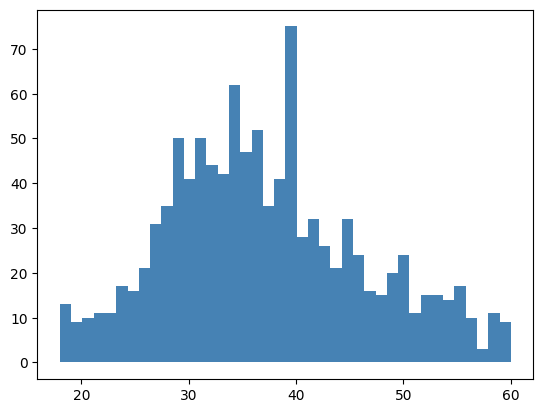

In [18]:
display_histogram(df_train, 'Age', 'Attrition')

zero counts bins:  0


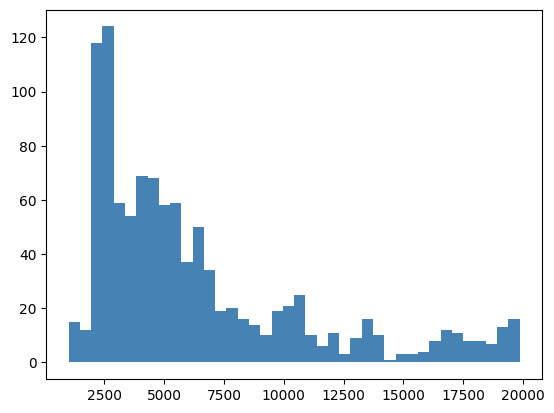

In [19]:
display_histogram(df_train, "MonthlyIncome", "Attrition")

zero counts bins:  11


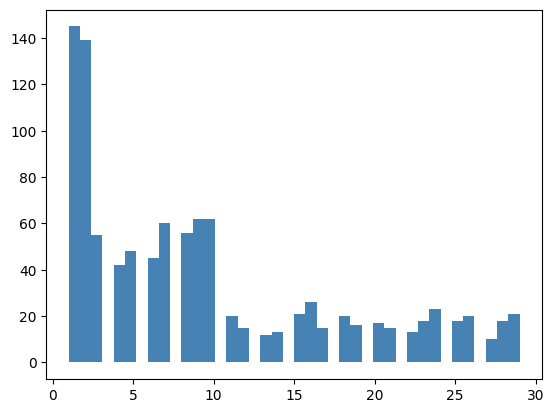

In [20]:
display_histogram(df_train, "DistanceFromHome", "Attrition")

### T4. Observe the histogram for Age, MonthlyIncome and DistanceFromHome. How many bins have zero counts? Do you think this is a good discretization? Why?

**Ans**: For `Age` and `MonthlyIncome` there are no zero counts, this is a good discretization because it is able to capture the distribution of the data. But for `DistanceFromHome` there are 11 bins with zero counts. This is not a good discretization because it is not be able to capture the distribution of the data.

### T5. Can we use a Gaussian to estimate this histogram? Why? What about a Gaussian Mixture Model (GMM)?

**Ans**: Could use Gaussian with `Age`, but for `MonthlyIncome` and `DistanceFromHome` it is not a good idea because the distribution is not seem like normal. for GMM is not a good idea because the distribution is not seem like have more than 1 gaussian, could use other distribution like exponential instead.

### T6. Now plot the histogram according to the method described above (with 10, 40, and 100 bins) and show 3 plots each for Age, MonthlyIncome, and DistanceFromHome. Which bin size is most sensible for each features? Why?

zero counts bins:  0


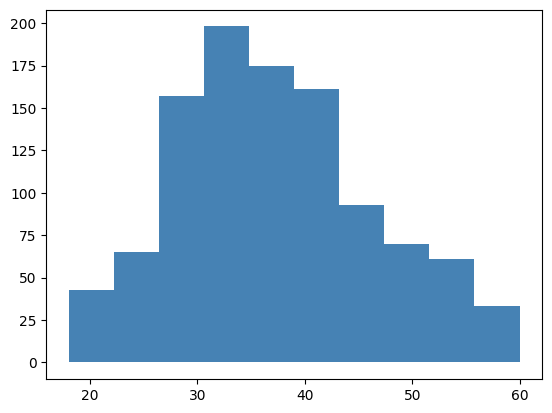

zero counts bins:  0


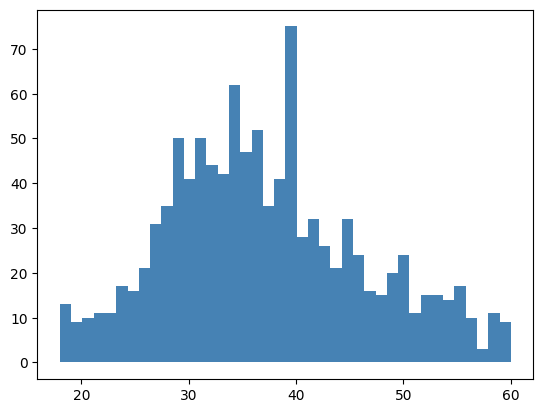

zero counts bins:  57


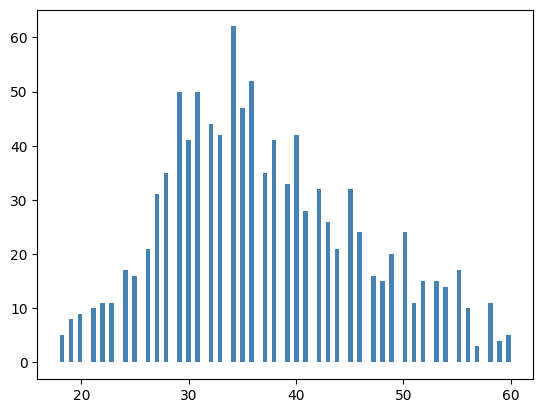

zero counts bins:  0


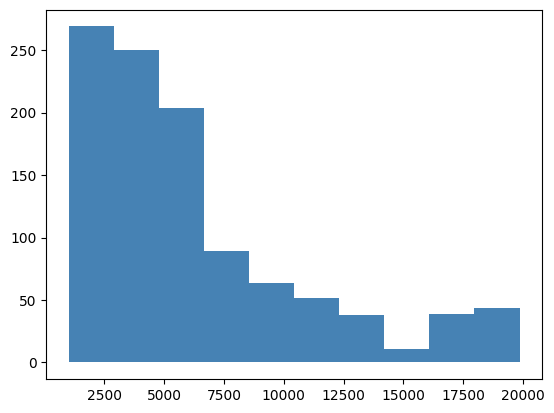

zero counts bins:  0


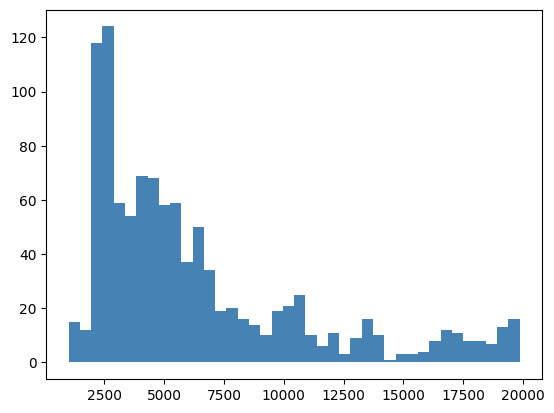

zero counts bins:  4


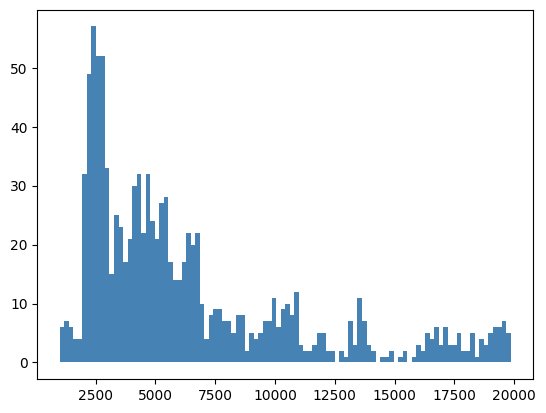

zero counts bins:  0


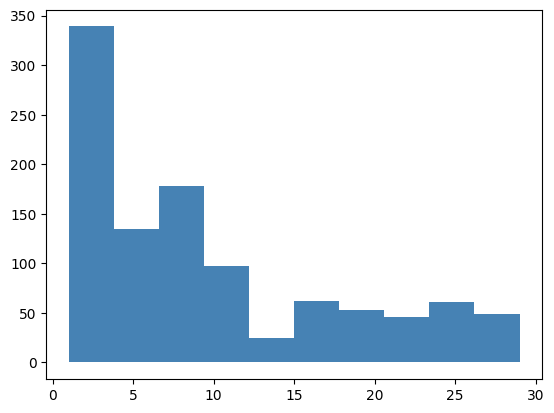

zero counts bins:  11


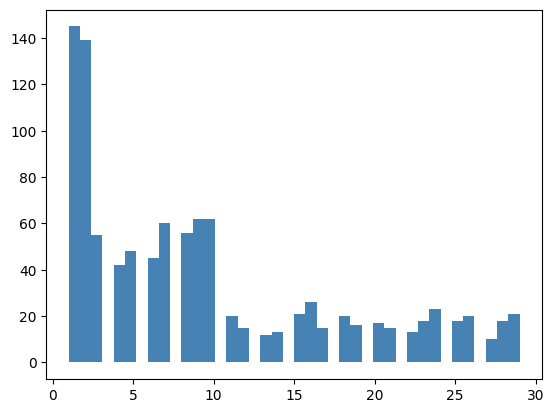

zero counts bins:  71


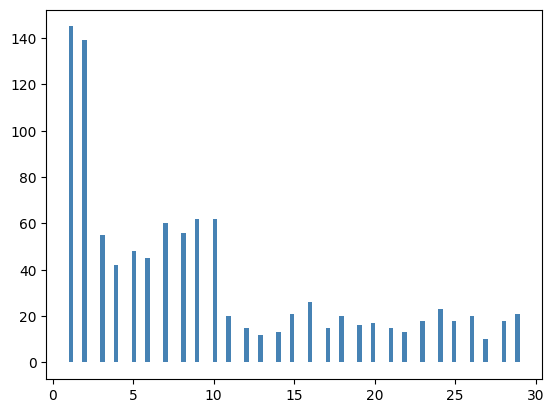

In [21]:
# fig, axes = plt.subplots(1, 3)
for i, col in enumerate(["Age", "MonthlyIncome", "DistanceFromHome"]):
    for n_bin in [10, 40, 100]:
        display_histogram(df_train, col, "Attrition", n_bin)

**Ans**:

`Age`: 40 bins because it is able to capture the distribution of the data without any zero counts bin.

`MonthlyIncome`: 40 bins because it is able to capture the distribution of the data without any zero counts bin.

`DistanceFromHome`: 10 bins because it is able to capture the distribution of the data without any zero counts bin.

In [22]:
df_train.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [23]:
df_train.describe()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1056.000000,1323.000000,1323.000000,1055.000000,1323.000000,1045.000000,1069.000000,1323.000000,1058.000000,1323.000000,...,1057.000000,1060.000000,1059.000000,1054.000000,1057.000000,1062.000000,1066.000000,1061.000000,1052.000000,1060.000000
mean,37.148674,0.160998,1.072562,800.645498,0.808768,9.531100,2.924228,1.612245,2.742911,0.272865,...,3.152318,2.709434,0.744098,11.308349,2.763482,2.778719,7.013133,4.277097,2.142586,4.102830
std,9.167822,0.367668,1.205457,404.392610,1.018965,8.243321,1.030827,1.762803,1.095303,0.770335,...,0.359499,1.095318,0.822447,7.828576,1.272848,0.704770,6.046597,3.601170,3.171383,3.570654
min,18.000000,0.000000,-1.000000,102.000000,-1.000000,1.000000,1.000000,-1.000000,1.000000,-1.000000,...,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,0.000000,464.000000,1.000000,2.000000,2.000000,1.000000,2.000000,0.000000,...,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,0.000000,2.000000,798.000000,1.000000,7.000000,3.000000,1.000000,3.000000,0.000000,...,3.000000,3.000000,1.000000,9.500000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,0.000000,2.000000,1164.500000,1.000000,15.000000,4.000000,3.000000,4.000000,1.000000,...,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,10.000000,7.000000,2.000000,7.000000
max,60.000000,1.000000,2.000000,1499.000000,2.000000,29.000000,5.000000,5.000000,4.000000,1.000000,...,4.000000,4.000000,3.000000,40.000000,6.000000,4.000000,37.000000,18.000000,15.000000,17.000000


In [24]:
df_train["YearsWithCurrManager"].describe()

count    1060.000000
mean        4.102830
std         3.570654
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        17.000000
Name: YearsWithCurrManager, dtype: float64

### T7. For the rest of the features, which one should be discretized in order to be modeled by histograms? What are the criteria for choosing whether we should discretize a feature or not? Answer this and discretize those features into 10 bins each. In other words, figure out the bin edge for each feature, then use digitize() to convert the features to discrete values

**Ans**: 

**discretize**: 
- continuous

['Age', 'DailyRate', 'DistanceFromHome', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate' 'PercentSalaryHike', 
'TotalWorkingYears', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager', 
'NumCompaniesWorked']

**not discretize**: 
- categorical

['BusinessTravel', 'Department', 'Education', 'EducationField', 'EnvironmentSatisfaction', 'Gender', 'PerformanceRating',
'RelationshipSatisfaction', 'StockOptionLevel', 'TrainingTimesLastYear', 'WorkLifeBalance', 
'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus', 'OverTime']

In [25]:
to_discretize_cols = [
    "Age",
    "DailyRate",
    "DistanceFromHome",
    "HourlyRate",
    "MonthlyIncome",
    "MonthlyRate",
    "PercentSalaryHike",
    "TotalWorkingYears",
    "YearsAtCompany",
    "YearsInCurrentRole",
    "YearsSinceLastPromotion",
    "YearsWithCurrManager",
    "NumCompaniesWorked",
]

In [26]:
n_bin = 10
bin_size = (df_train["Age"].max() - df_train["Age"].min())/n_bin
# print(bin_size)
bins = np.linspace(df_train["Age"].min(), df_train["Age"].max(), n_bin)
# print(bins)
bin_inds = np.digitize(df_train['Age'], bins)
# print(bin_inds)

def get_bin_inds(df, col_name, n_bin=10):
    bins = np.linspace(df[col_name].min(), df[col_name].max(), n_bin)
    return np.digitize(df[col_name], bins)

# get_bin_inds(df_train, "DailyRate")
# df_train["Age"] = get_bin_inds(df_train, "Age")

In [27]:
for col in to_discretize_cols:
    print(get_bin_inds(df_train, col))

[5 4 6 ... 1 4 5]
[ 4 10 10 ... 10  3  5]
[2 1 4 ... 3 1 7]
[ 4  4  4 ... 10  6  7]
[1 3 1 ... 1 3 2]
[ 5 10 10 ...  2 10  7]
[10  2 10 ... 10  8  5]
[1 5 2 ... 1 4 2]
[ 1 10  2 ...  1  1  1]
[10  8  2 ...  2  1  1]
[ 1 10 10 ... 10  1  2]
[10  6  3 ...  1  1  2]
[ 2  2 10 ...  2 10  3]


### T8. What kind of distribution should we use to model histograms? (Answer a distribution name) What is the MLE for the likelihood distribution? (Describe how to do the MLE). Plot the likelihood distributions of MonthlyIncome, JobRole, HourlyRate, and MaritalStatus for different Attrition values.

**Ans**: Multinomial distribution because it is like a binomial distribution but it has more than 2 outcomes. The MLE is $\frac{count}{n}$ where count is the number of times the outcome occurred and n is the number of trials.

In [28]:
# plot likelihood distribution for each attrition values p(x|w0) and p(x|w1)
def plot_likelihood(df, col_name, n_bin=10):
    # INSERT CODE HERE
    bins = np.linspace(df[col_name].min(), df[col_name].max(), n_bin)
    bin_inds = np.digitize(df[col_name], bins)

    # p(x|w0)
    p_x_w0 = np.zeros(n_bin)
    p_x_w1 = np.zeros(n_bin)

    for i in range(n_bin):
        p_x_w0[i] = np.sum((df[col_name][df['Attrition'] == 0] == bins[i])) / np.sum(df['Attrition'] == 0)
        p_x_w1[i] = np.sum((df[col_name][df['Attrition'] == 1] == bins[i])) / np.sum(df['Attrition'] == 1)

    plt.hist(df[col_name][df['Attrition'] == 0], bins, alpha=0.5, label='w0')
    plt.hist(df[col_name][df['Attrition'] == 1], bins, alpha=0.5, label='w1')
    
    # plt.plot(bins, p_x_w0, 'g+', lw=2, label='P(x|w0)')
    # plt.plot(bins, p_x_w1, 'b+', lw=2, label='P(x|w1)')
    
    plt.legend()
    plt.show()

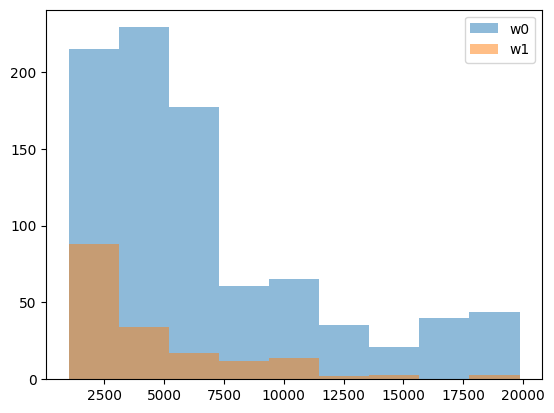

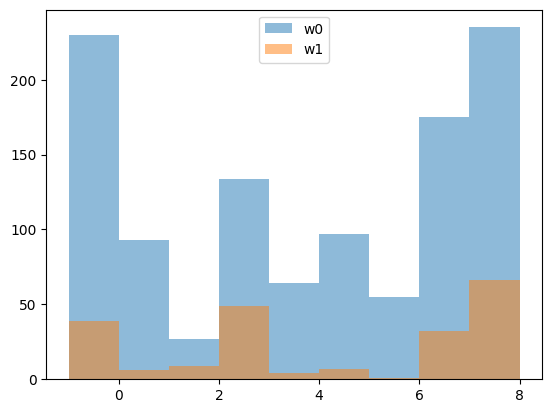

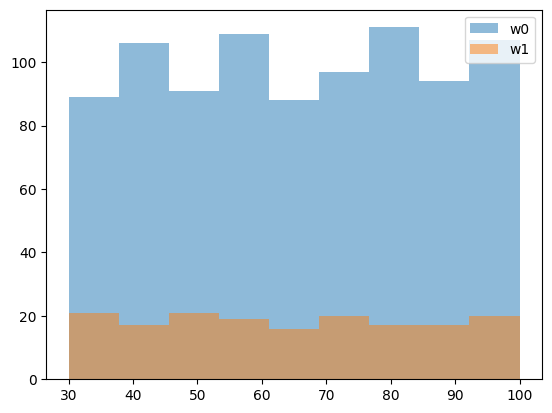

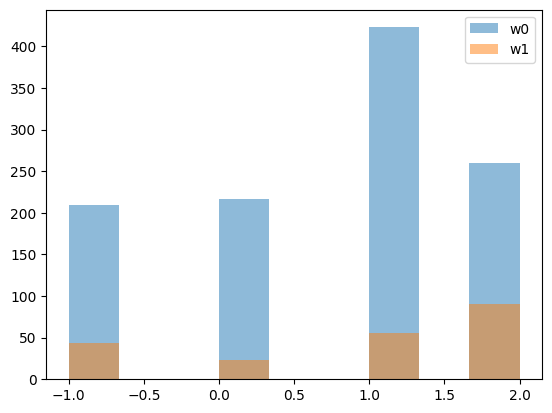

In [29]:
for col in ["MonthlyIncome", "JobRole", "HourlyRate", "MaritalStatus"]:
    plot_likelihood(df_train, col)

### T9. What is the prior distribution of the two classes?

In [30]:
df['Attrition'].value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

### T10. If we use the current Naive Bayes with our current Maximum Likelihood Estimates, we will find that some P (x i |attrition) will be zero and will result in the entire product term to be zero. Propose a method to fix this problem.

**Ans**: add very small value to the zero probability.

### T11. Implement your Naive Bayes classifier. Use the learned distributions to classify the test set. Don’t forget to allow your classifier to handle missing values in the test set. Report the overall Accuracy. Then, report the Precision, Recall, and F score for detecting attrition. See Lecture 1 for the definitions of each metric.


In [31]:
from SimpleBayesClassifier import SimpleBayesClassifier

In [32]:
data_train = df_train.to_numpy()
data_test = df_test.to_numpy()

In [33]:
x_train = df_train.drop(columns=['Attrition']).to_numpy()
y_train = df_train['Attrition'].to_numpy()

x_test = df_test.drop(columns=['Attrition']).to_numpy()
y_test = df_test['Attrition'].to_numpy()

In [34]:
y_train.shape == np.sum(y_train == 0) + np.sum(y_train == 1)

array([ True])

In [35]:
model = SimpleBayesClassifier(n_pos=np.sum(y_train == 1), n_neg=np.sum(y_train == 0))

In [36]:
def check_prior():
    """
    This function designed to test the implementation of the prior probability calculation in a Naive Bayes classifier. 
    Specifically, it checks if the classifier correctly computes the prior probabilities for the 
    negative and positive classes based on given input counts.
    """
    
    # prior_neg = 5/(5 + 5) = 0.5 and # prior_pos = 5/(5 + 5) = 0.5
    assert (SimpleBayesClassifier(5, 5).prior_pos, SimpleBayesClassifier(5, 5).prior_neg) == (0.5, 0.5)

    assert (SimpleBayesClassifier(3, 5).prior_pos, SimpleBayesClassifier(3, 5).prior_neg) == (3/8, 5/8)
    assert (SimpleBayesClassifier(0, 1).prior_pos, SimpleBayesClassifier(0, 1).prior_neg) == (0, 1)
    assert (SimpleBayesClassifier(1, 0).prior_pos, SimpleBayesClassifier(1, 0).prior_neg) == (1, 0)
    
check_prior()

In [37]:
model.fit_params(x_train, y_train);

In [38]:
def check_fit_params():

    """
    This function is designed to test the fit_params method of a SimpleBayesClassifier. 
    This method is presumably responsible for computing parameters for a Naive Bayes classifier 
    based on the provided training data. The parameters in this context is bins and edges from each histogram.
    """

    T = SimpleBayesClassifier(2, 2)
    X_TRAIN_CASE_1 = np.array([
        [0, 1, 2, 3],
        [1, 2, 3, 4],
        [2, 3, 4, 5],
        [3, 4, 5, 6]
    ])
    Y_TRAIN_CASE_1 = np.array([0, 1, 0, 1])
    STAY_PARAMS_1, LEAVE_PARAMS_1 = T.fit_params(X_TRAIN_CASE_1, Y_TRAIN_CASE_1)

    print("STAY PARAMETERS")
    for f_idx in range(len(STAY_PARAMS_1)):
        print(f"Feature : {f_idx}")
        print(f"BINS : {STAY_PARAMS_1[f_idx][0]}")
        print(f"EDGES : {STAY_PARAMS_1[f_idx][1]}")
    print("")    
    print("LEAVE PARAMETERS")
    for f_idx in range(len(STAY_PARAMS_1)):
        print(f"Feature : {f_idx}")
        print(f"BINS : {LEAVE_PARAMS_1[f_idx][0]}")
        print(f"EDGES : {LEAVE_PARAMS_1[f_idx][1]}")

check_fit_params()

STAY PARAMETERS
Feature : 0
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [0.  0.2 0.4 0.6 0.8 1.  1.2 1.4 1.6 1.8 2. ]
Feature : 1
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [1.  1.2 1.4 1.6 1.8 2.  2.2 2.4 2.6 2.8 3. ]
Feature : 2
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [2.  2.2 2.4 2.6 2.8 3.  3.2 3.4 3.6 3.8 4. ]
Feature : 3
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [3.  3.2 3.4 3.6 3.8 4.  4.2 4.4 4.6 4.8 5. ]

LEAVE PARAMETERS
Feature : 0
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [1.  1.2 1.4 1.6 1.8 2.  2.2 2.4 2.6 2.8 3. ]
Feature : 1
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [2.  2.2 2.4 2.6 2.8 3.  3.2 3.4 3.6 3.8 4. ]
Feature : 2
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [3.  3.2 3.4 3.6 3.8 4.  4.2 4.4 4.6 4.8 5. ]
Feature : 3
BINS : [2.5 0.  0.  0.  0.  0.  0.  0.  0.  2.5]
EDGES : [4.  4.2 4.4 4.6 4.8 5.  5.2 5.4 5.6 5.8 6. ]


In [ ]:
y_pred = model.predict(x = x_test)

In [209]:
def evaluate(y_true, y_pred, show_result = True):
  
  y_true = np.array(y_true)
  y_pred = np.array(y_pred)
  
  accuracy = np.sum(y_true == y_pred) / len(y_true)
  precision = np.sum((y_true == 1) & (y_pred == 1)) / np.sum(y_pred == 1) if np.sum(y_pred == 1) > 0 else 0
  recall = np.sum((y_true == 1) & (y_pred == 1)) / np.sum(y_true == 1)
  F1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
  fpr = np.sum((y_true == 0) & (y_pred == 1)) / np.sum(y_true == 0)
  
  return accuracy, precision, recall, F1, fpr

In [210]:
evaluate(y_test, y_pred)

(0.8027210884353742,
 0.3684210526315789,
 0.2916666666666667,
 0.32558139534883723,
 0.0975609756097561)

### T12. Use the learned distributions to classify the test set. Report the results using the same metric as the previous question.


In [211]:
model.fit_gaussian_params(x_train, y_train);

In [212]:
def check_fit_gaussian_params():

    """
    This function is designed to test the fit_gaussian_params method of a SimpleBayesClassifier. 
    This method is presumably responsible for computing parameters for a Naive Bayes classifier 
    based on the provided training data. The parameters in this context is mean and STD.
    """

    T = SimpleBayesClassifier(2, 2)
    X_TRAIN_CASE_1 = np.array([
        [0, 1, 2, 3],
        [1, 2, 3, 4],
        [2, 3, 4, 5],
        [3, 4, 5, 6]
    ])
    Y_TRAIN_CASE_1 = np.array([0, 1, 0, 1])
    STAY_PARAMS_1, LEAVE_PARAMS_1 = T.fit_gaussian_params(X_TRAIN_CASE_1, Y_TRAIN_CASE_1)

    print("STAY PARAMETERS")
    for f_idx in range(len(STAY_PARAMS_1)):
        print(f"Feature : {f_idx}")
        print(f"Mean : {STAY_PARAMS_1[f_idx][0]}")
        print(f"STD. : {STAY_PARAMS_1[f_idx][1]}")
    print("")    
    print("LEAVE PARAMETERS")
    for f_idx in range(len(STAY_PARAMS_1)):
        print(f"Feature : {f_idx}")
        print(f"Mean : {LEAVE_PARAMS_1[f_idx][0]}")
        print(f"STD. : {LEAVE_PARAMS_1[f_idx][1]}")
    
check_fit_gaussian_params()

STAY PARAMETERS
Feature : 0
Mean : 1.0
STD. : 1.0
Feature : 1
Mean : 2.0
STD. : 1.0
Feature : 2
Mean : 3.0
STD. : 1.0
Feature : 3
Mean : 4.0
STD. : 1.0

LEAVE PARAMETERS
Feature : 0
Mean : 2.0
STD. : 1.0
Feature : 1
Mean : 3.0
STD. : 1.0
Feature : 2
Mean : 4.0
STD. : 1.0
Feature : 3
Mean : 5.0
STD. : 1.0


In [213]:
y_pred = model.gaussian_predict(x_test)

In [214]:
evaluate(y_test, y_pred)

(0.782312925170068,
 0.3181818181818182,
 0.2916666666666667,
 0.30434782608695654,
 0.12195121951219512)

### T13 : The random choice baseline is the accuracy if you make a random guess for each test sample. Give random guess (50% leaving, and 50% staying) to the test samples. Report the overall Accuracy. Then, report the Precision, Recall, and F score for attrition prediction using the random choice baseline.

In [215]:
y_pred_random = np.random.randint(0, 2, size=y_test.shape)

### T14. The majority rule is the accuracy if you use the most frequent class from the training set as the classification decision. Report the overall Accuracy. Then, report the Precision, Recall, and F score for attrition prediction using the majority rule baseline.



In [216]:
y_pred_majority = np.zeros(y_test.shape)

### T15. Compare the two baselines with your Naive Bayes classifier.


In [217]:
# compare
print("Random Prediction")
print(evaluate(y_test, y_pred_random))
print("Majority Prediction")
print(evaluate(y_test, y_pred_majority))
print("Bayes Prediction")
print(evaluate(y_test, y_pred))

Random Prediction
(0.46938775510204084, 0.125, 0.375, 0.1875, 0.5121951219512195)
Majority Prediction
(0.8367346938775511, 0, 0.0, 0, 0.0)
Bayes Prediction
(0.782312925170068, 0.3181818181818182, 0.2916666666666667, 0.30434782608695654, 0.12195121951219512)


**Ans**: The Naive Bayes classifier has better performance than the two baselines.

### T16. Use the following threshold values
$ t = np.arange(-5,5,0.05) $
### find the best accuracy, and F score (and the corresponding thresholds)


In [218]:
best_acc = 0
best_f = 0
for thresh in np.arange(-5, 5, 0.05):
    y_pred = model.predict(x = x_test, thresh = thresh)
    # print(f"Threshold: {thresh}")
    # print(evaluate(y_test, y_pred))
    acc, _, _, f, _ = evaluate(y_test, y_pred)
    if acc > best_acc and f > best_f:
        best_acc = acc
        best_f = f
        best_thresh = thresh

print(f"Best Accuracy: {best_acc} and F score: {best_f} with threshold: {best_thresh}")

Best Accuracy: 0.7551020408163265 and F score: 0.4375 with threshold: -2.1000000000000103


### T17. Plot the RoC of your classifier.

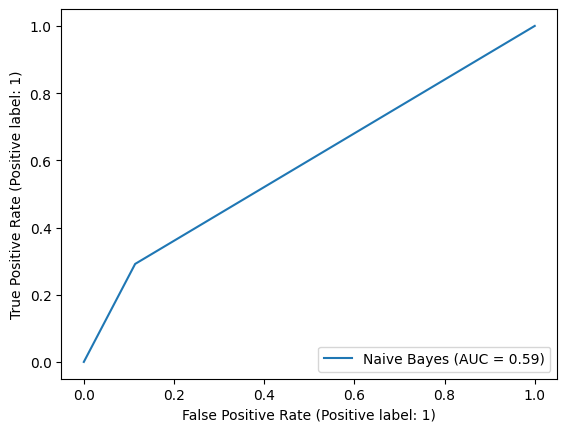

In [219]:
from sklearn.metrics import RocCurveDisplay
y_pred = model.predict(x=x_test, thresh=-0.25)
RocCurveDisplay.from_predictions(y_test, y_pred, name="Naive Bayes")

### T18. Change the number of discretization bins to 5. What happens to the RoC curve? Which discretization is better? The number of discretization bins can be considered as a hyperparameter, and must be chosen by comparing the final performance.


In [220]:
model.fit_params(x_train, y_train, n_bins=5)

best_acc = 0
best_f = 0
for thresh in np.arange(-5, 5, 0.05):
    y_pred = model.predict(x=x_test, thresh=thresh)
    # print(f"Threshold: {thresh}")
    # print(evaluate(y_test, y_pred))
    acc, _, _, f, _ = evaluate(y_test, y_pred)
    if acc > best_acc and f > best_f:
        best_acc = acc
        best_f = f
        best_thresh = thresh

print(f"Best Accuracy: {best_acc} and F score: {best_f} with threshold: {best_thresh}")

KeyboardInterrupt: 

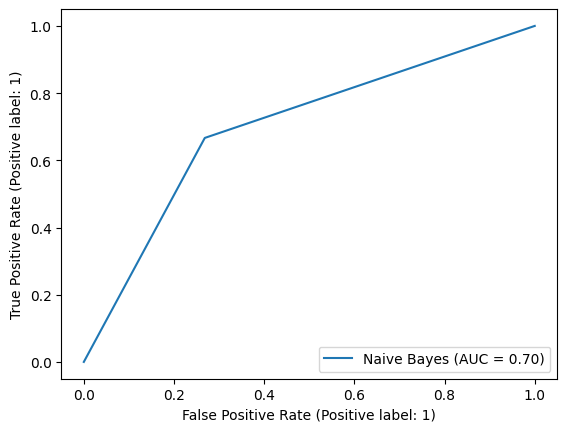

In [ ]:
y_pred = model.predict(x=x_test, thresh=-1.6)
RocCurveDisplay.from_predictions(y_test, y_pred, name="Naive Bayes")

**Ans**: The RoC curve has more AUC, and it is better for 5 bins. 

### OT4. Shuffle the database, and create new test and train sets. Redo the entire training and evaluation process 10 times (each time with a new training and test set). Calculate the mean and variance of the accuracy rate.

In [ ]:
accs = []
for i in range(10):
    df_train, df_test = train_test_split(df, test_size=0.1, random_state=i, stratify=df["Attrition"])
    model.fit_params(df_train.drop(columns=["Attrition"]).to_numpy(), df_train["Attrition"].to_numpy())
    y_pred = model.predict(x=df_test.drop(columns=["Attrition"]).to_numpy(), thresh=0)
    print(f"{evaluate(df_test['Attrition'].to_numpy(), y_pred)}")
    accs.append(evaluate(df_test['Attrition'].to_numpy(), y_pred)[0])

In [ ]:
print(f"mean accuracy: {np.mean(accs)}, variance: {np.var(accs)}")

mean accuracy: 0.8136054421768707, variance: 0.0015012263408764861
